# [EDA] Investigate data augmentation 
---
- DataAugmentation の練習をする

In [1]:
# ===============
# libraries
# ===============
import os, gc, yaml, glob, pickle
import time
import random
from pathlib import Path
from types import SimpleNamespace

import numpy as np
import polars as pl
import pandas as pd
from tqdm import tqdm

# 可視化用
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
# import matplotlib_fontja

# wandb
import wandb

import warnings
# warnings.filterwarnings('ignore')

# original
import sys
sys.path.append("../src")
from utils.data import sep, show_df, glob_walk, set_seed, save_config_yaml, dict_to_namespace

from datetime import datetime
date = datetime.now().strftime("%Y%m%d")
print(f"TODAY is {date}")

TODAY is 20251226


In [2]:
# ===============
# Config 
# ===============
config = SimpleNamespace(
    # データパス
    # data_dir = Path("/kaggle/input/csiro-biomass"),
    data_dir = Path("/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw"),
    
    # 基本設定
    seed = 42,
    
    # WandB設定
    wandb_entity = "hidebu",
    wandb_project = "csiro-biomass",
    wandb_base_url = "https://toyota.wandb.io",  # パブリックWandBの場合は削除
    # wandb_secret_label = "wandb_tmc_key",

    # 可視化設定
    num_visualization_samples = 500, # 可視化する分子のサンプル数
    generate_html_report = True,     # HTMLレポートを生成するか    
)

In [3]:
# ==========================
# WandB認証設
# ==========================
os.environ["WANDB_ENTITY"] = config.wandb_entity
os.environ["WANDB_PROJECT"] = config.wandb_project
os.environ["WANDB_BASE_URL"] = config.wandb_base_url
# os.environ["WANDB_API_KEY"] = UserSecretsClient().get_secret(config.wandb_secret_label)

# Base group to keep runs together (timestamped)
BASE_GROUP = os.environ.get("WANDB_BASE_GROUP", "")
if not BASE_GROUP:
    BASE_GROUP = f"lc-sample-{datetime.now().strftime('%Y%m%d-%H%M%S')}"
    os.environ["WANDB_BASE_GROUP"] = BASE_GROUP

In [4]:
# =================
# Load data 
# =================
train = pl.read_csv(config.data_dir / "train.csv")
test = pl.read_csv(config.data_dir / "test.csv")
sub = pl.read_csv(config.data_dir / "sample_submission.csv")

sep("train"); show_df(train, 3, True); 

train
(1785, 9)


sample_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,target_name,target
str,str,str,str,str,f64,f64,str,f64
"""ID1011485656__Dry_Clover_g""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,"""Dry_Clover_g""",0.0
"""ID1011485656__Dry_Dead_g""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,"""Dry_Dead_g""",31.9984
"""ID1011485656__Dry_Green_g""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,"""Dry_Green_g""",16.2751


sample_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,target_name,target
str,str,str,str,str,f64,f64,str,f64
"""ID983582017__Dry_Green_g""","""train/ID983582017.jpg""","""2015/9/1""","""WA""","""Ryegrass""",0.64,9.0,"""Dry_Green_g""",40.94
"""ID983582017__Dry_Total_g""","""train/ID983582017.jpg""","""2015/9/1""","""WA""","""Ryegrass""",0.64,9.0,"""Dry_Total_g""",40.94
"""ID983582017__GDM_g""","""train/ID983582017.jpg""","""2015/9/1""","""WA""","""Ryegrass""",0.64,9.0,"""GDM_g""",40.94


In [5]:
#  2-2. group_byとpivotを使って各画像ごとのバイオマステーブルを作成
sep("Creating pivoted biomass table")

# sample_idから画像IDを抽出
train_df_with_id = train.with_columns(
    pl.col('sample_id').str.extract(r'(ID\d+)').alias('image_id')
)

# Polarsでpivot操作 - sample_idをindexから除外
train_pivot_df = train_df_with_id.pivot(
    values='target',
    index=['image_id', 'image_path', 'Sampling_Date', 'State', 'Species', 'Pre_GSHH_NDVI', 'Height_Ave_cm'],
    on='target_name',  # 'columns'ではなく'on'を使用
)

print(f"Pivoted dataframe shape: {train_pivot_df.shape}")
show_df(train_pivot_df, 3)

# データの確認
print("\n=== Checking for null values ===")
null_counts = train_pivot_df.null_count()
show_df(null_counts)

Creating pivoted biomass table
Pivoted dataframe shape: (357, 12)
(357, 12)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g
str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64
"""ID1011485656""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,0.0,31.9984,16.2751,48.2735,16.275
"""ID1012260530""","""train/ID1012260530.jpg""","""2015/4/1""","""NSW""","""Lucerne""",0.55,16.0,0.0,0.0,7.6,7.6,7.6
"""ID1025234388""","""train/ID1025234388.jpg""","""2015/9/1""","""WA""","""SubcloverDalkeith""",0.38,1.0,6.05,0.0,0.0,6.05,6.05



=== Checking for null values ===
(1, 12)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
# =====================
# train_image_data
# =====================
train_img_paths = glob_walk(config.data_dir/"train", "*.jpg")
sep("train_imgs")
print(f"Number of train_img: {len(train_img_paths)}")
print("examples\n"); print(train_img_paths[:3])

train_imgs
Number of train_img: 357
examples

[PosixPath('/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1011485656.jpg'), PosixPath('/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1012260530.jpg'), PosixPath('/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1025234388.jpg')]


In [7]:
#  2-3. Sampling_Dateを分解して年、月、曜日の列を作成
sep(" Decomposing Sampling_Date ")

train_pivot_df = train_pivot_df.with_columns([
    pl.col('Sampling_Date').str.strptime(pl.Date, '%Y/%m/%d').alias('date'),
]).with_columns([
    pl.col('date').dt.year().alias('year'),
    pl.col('date').dt.month().alias('month'),
    pl.col('date').dt.day().alias('day'),
    pl.col('date').dt.weekday().alias('weekday'),  # 0=Monday, 6=Sunday
])

# 曜日名を追加
weekday_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
train_pivot_df = train_pivot_df.with_columns(
    pl.col('weekday').map_elements(lambda x: weekday_map.get(x, 'Unknown'), return_dtype=pl.Utf8).alias('weekday_name')
)

show_df(train_pivot_df, 3)

 Decomposing Sampling_Date 
(357, 18)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g,date,year,month,day,weekday,weekday_name
str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,date,i32,i8,i8,i8,str
"""ID1011485656""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,0.0,31.9984,16.2751,48.2735,16.275,2015-09-04,2015,9,4,5,"""Sat"""
"""ID1012260530""","""train/ID1012260530.jpg""","""2015/4/1""","""NSW""","""Lucerne""",0.55,16.0,0.0,0.0,7.6,7.6,7.6,2015-04-01,2015,4,1,3,"""Thu"""
"""ID1025234388""","""train/ID1025234388.jpg""","""2015/9/1""","""WA""","""SubcloverDalkeith""",0.38,1.0,6.05,0.0,0.0,6.05,6.05,2015-09-01,2015,9,1,2,"""Wed"""


In [8]:
# 2-4. Species列からOne-hot encodingを作成
sep("Creating One-hot encoding for Species")

# まず、全ての種類を抽出
sep(" Extracting unique species ")

all_species = set()
for species_str in train_pivot_df['Species'].to_list():
    if species_str and species_str != 'null':
        # アンダースコアで分割して各種を抽出
        species_list = species_str.split('_')
        all_species.update(species_list)

# ソートして一覧表示
all_species = sorted(all_species)
print(f"Number of unique species: {len(all_species)}")
print(f"Species list: {all_species}")

# One-hot encodingを作成
print("\n=== Creating one-hot encoding ===")

# 各種についてis_{species}列を作成
for species in all_species:
    col_name = f'is_{species}'
    train_pivot_df = train_pivot_df.with_columns(
        pl.col('Species').str.contains(species).fill_null(False).alias(col_name)
    )

# 作成された列を確認
species_cols = [f'is_{species}' for species in all_species]
print(f"\nCreated {len(species_cols)} species indicator columns")
show_df(train_pivot_df.select(['image_id', 'Species'] + species_cols[:5]), 3)  # 最初の5列だけ表示

# 各種の出現頻度を確認
print("\n=== Species frequency ===")
for species in all_species:
    count = train_pivot_df[f'is_{species}'].sum()
    print(f"{species}: {count} images ({count/len(train_pivot_df)*100:.1f}%)")

Creating One-hot encoding for Species
 Extracting unique species 
Number of unique species: 16
Species list: ['BarleyGrass', 'Barleygrass', 'Bromegrass', 'Capeweed', 'Clover', 'CrumbWeed', 'Fescue', 'Lucerne', 'Mixed', 'Phalaris', 'Ryegrass', 'SilverGrass', 'SpearGrass', 'SubcloverDalkeith', 'SubcloverLosa', 'WhiteClover']

=== Creating one-hot encoding ===

Created 16 species indicator columns
(357, 7)


image_id,Species,is_BarleyGrass,is_Barleygrass,is_Bromegrass,is_Capeweed,is_Clover
str,str,bool,bool,bool,bool,bool
"""ID1011485656""","""Ryegrass_Clover""",false,false,false,false,true
"""ID1012260530""","""Lucerne""",false,false,false,false,false
"""ID1025234388""","""SubcloverDalkeith""",false,false,false,false,false



=== Species frequency ===
BarleyGrass: 11 images (3.1%)
Barleygrass: 7 images (2.0%)
Bromegrass: 7 images (2.0%)
Capeweed: 11 images (3.1%)
Clover: 217 images (60.8%)
CrumbWeed: 10 images (2.8%)
Fescue: 38 images (10.6%)
Lucerne: 22 images (6.2%)
Mixed: 2 images (0.6%)
Phalaris: 76 images (21.3%)
Ryegrass: 175 images (49.0%)
SilverGrass: 11 images (3.1%)
SpearGrass: 11 images (3.1%)
SubcloverDalkeith: 3 images (0.8%)
SubcloverLosa: 5 images (1.4%)
WhiteClover: 10 images (2.8%)


In [9]:
# Configに変数を追加
config.train_pivot_df = train_pivot_df
config.target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
config.weekday_map = weekday_map
config.species_cols = species_cols
config.all_species  = all_species

In [10]:
def visualize_imgs(sample_data, savepath=None):
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()

    for idx, (ax, (_, row)) in enumerate(zip(axes, sample_data.iterrows())):
        # 画像を読み込み
        img_path = config.data_dir / row['image_path']
        
        if img_path.exists():
            img = Image.open(img_path)
            ax.imshow(img)
            ax.axis('off')
            
            # メタデータを表示
            info_text = (
                f"ID: {row['image_id']}\n"
                f"Date: {row['year']}/{row['month']:02d}/{row['day']:02d} ({row['weekday_name']})\n"
                f"State: {row['State']}\n"
                f"Species: {row['Species'][:30]}...\n"
                f"NDVI: {row['Pre_GSHH_NDVI']:.3f}\n"
                f"Height: {row['Height_Ave_cm']:.2f} cm\n"
                f"---Biomass (g)---\n"
                f"Green: {row['Dry_Green_g']:.2f}\n"
                f"Dead: {row['Dry_Dead_g']:.2f}\n"
                f"Clover: {row['Dry_Clover_g']:.2f}\n"
                f"GDM: {row['GDM_g']:.2f}\n"
                f"Total: {row['Dry_Total_g']:.2f}"
            )
            
            ax.text(0.02, 0.98, info_text, transform=ax.transAxes,
                    fontsize=8, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center')
            ax.axis('off')

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=150, bbox_inches='tight')
    plt.show()


=== Visualizing sample images with metadata ===


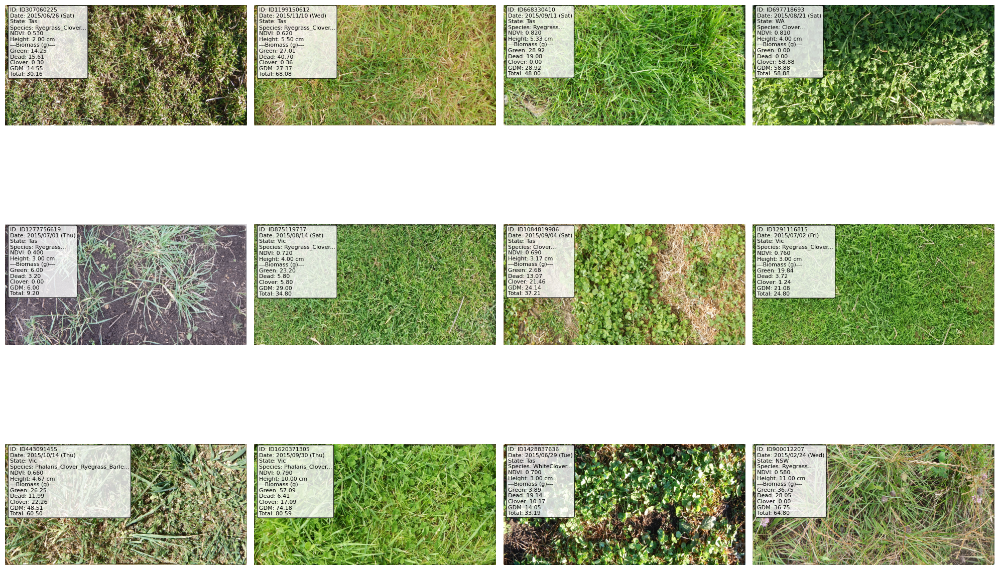

In [11]:
# 2-5. 画像とメタデータの可視化 (4列×3行)
print("\n=== Visualizing sample images with metadata ===")

# PandasのDataFrameに変換(可視化用)
train_pivot_pd = train_pivot_df.to_pandas()

# ランダムに12サンプルを選択
np.random.seed(config.seed)
sample_indices = np.random.choice(len(train_pivot_pd), size=min(12, len(train_pivot_pd)), replace=False)
sample_data = train_pivot_pd.iloc[sample_indices]

# 可視化
visualize_imgs(sample_data, savepath=None)

In [12]:
# =======================
# Check img size
# =======================
for i, img_path in tqdm(enumerate(train_img_paths)):
    img = Image.open(img_path)
    print(f"img_size {img.size}, img_path: {img_path}")
    if i == 7:
        break

7it [00:00, 1077.24it/s]

img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1011485656.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1012260530.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1025234388.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1028611175.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1035947949.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1036339023.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1049634115.jpg
img_size (2000, 1000), img_path: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/data/raw/train/ID1051144034.jpg


In [13]:
y_cols = ["Dry_Clover_g", "Dry_Dead_g", "Dry_Green_g", "Dry_Total_g", "GDM_g"]
img_ids = train_pivot_df["image_id"].to_list()
H, W = 1000, 2000  # 固定

print(img_ids[:3])

['ID1011485656', 'ID1012260530', 'ID1025234388']


orig_y: [[ 0.     31.9984 16.2751 48.2735 16.275 ]]
keep_ratio: 0.962895
crop_y: [[ 0.       30.811098 15.671213 46.482307 15.671115]]


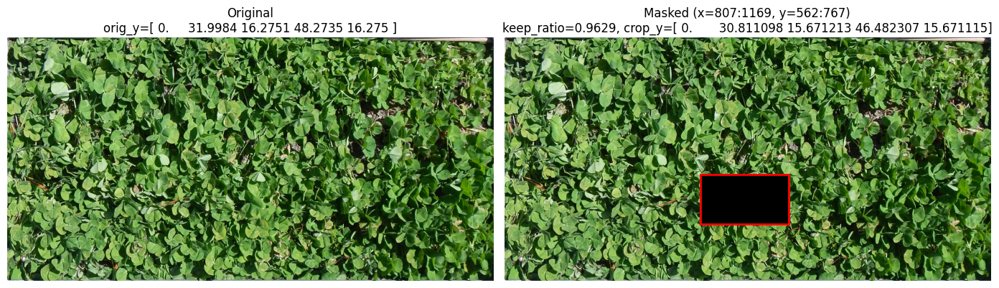

In [14]:
import matplotlib.patches as patches

idx = 0
img_id = img_ids[idx]

# --- load original ---
img = Image.open(img_path).convert("RGB")
arr_orig = np.array(img)
H, W = arr_orig.shape[:2]

orig_y = train_pivot_df.filter(pl.col("image_id")==img_id).select(y_cols).to_numpy().astype(np.float32)
print(f"orig_y: {orig_y}")

# --- masking params ---
mask_w = random.randint(0, min(500, W))
mask_h = random.randint(0, min(500, H))

x0 = random.randint(0, W - mask_w) if mask_w > 0 else 0
y0 = random.randint(0, H - mask_h) if mask_h > 0 else 0

area = mask_w * mask_h
keep_ratio = (H * W - area) / (H * W)
crop_y = orig_y * keep_ratio

print(f"keep_ratio: {keep_ratio}")
print(f"crop_y: {crop_y}")

# --- apply mask (make a copy!) ---
arr_masked = arr_orig.copy()
arr_masked[y0:y0+mask_h, x0:x0+mask_w, :] = 0

# --- plot ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(arr_orig)
axes[0].set_title(f"Original\norig_y={orig_y.flatten()}")
axes[0].axis("off")

axes[1].imshow(arr_masked)
axes[1].set_title(f"Masked (x={x0}:{x0+mask_w}, y={y0}:{y0+mask_h})\nkeep_ratio={keep_ratio:.4f}, crop_y={crop_y.flatten()}")
axes[1].axis("off")

# optional: draw rectangle on masked image
rect = patches.Rectangle((x0, y0), mask_w, mask_h, linewidth=2, edgecolor="r", facecolor="none")
axes[1].add_patch(rect)

plt.tight_layout()
plt.show()

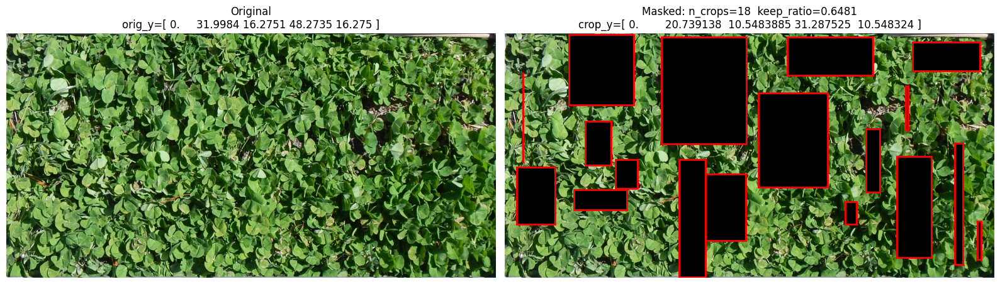

boxes: [(47, 546, 156, 236), (1391, 689, 45, 93), (639, 14, 346, 437), (819, 574, 164, 273), (1838, 448, 34, 497), (1600, 504, 142, 413), (328, 360, 104, 178), (1035, 244, 284, 386), (261, 3, 265, 290), (1638, 216, 10, 180), (1153, 15, 349, 156), (451, 516, 89, 118), (710, 516, 108, 480), (72, 159, 2, 369), (1476, 389, 55, 261), (1666, 35, 274, 117), (1929, 769, 17, 156), (282, 639, 215, 83)]
total_area: 703739 keep_ratio: 0.6481305


In [15]:
def sample_non_overlapping_boxes(W, H, n_boxes, max_w=500, max_h=500, max_tries=2000):
    boxes = []
    tries = 0

    def overlaps(a, b):
        ax, ay, aw, ah = a
        bx, by, bw, bh = b
        return not (ax + aw <= bx or bx + bw <= ax or ay + ah <= by or by + bh <= ay)

    while len(boxes) < n_boxes and tries < max_tries:
        tries += 1
        w = random.randint(1, min(max_w, W))   # 0は避ける
        h = random.randint(1, min(max_h, H))
        x0 = random.randint(0, W - w)
        y0 = random.randint(0, H - h)

        cand = (x0, y0, w, h)
        if any(overlaps(cand, b) for b in boxes):
            continue
        boxes.append(cand)

    return boxes

# =====================
# main
# =====================
idx = 0
img_id = img_ids[idx]

img = Image.open(img_path).convert("RGB")
arr_orig = np.array(img)
H, W = arr_orig.shape[:2]

orig_y = train_pivot_df.filter(pl.col("image_id")==img_id).select(y_cols).to_numpy().astype(np.float32)

n_crops = random.randint(0, 20)
boxes = sample_non_overlapping_boxes(W, H, n_crops, max_w=500, max_h=500)

total_area = sum(w*h for (_, _, w, h) in boxes)
keep_ratio = (H * W - total_area) / (H * W)
crop_y = orig_y * keep_ratio

arr_masked = arr_orig.copy()
for (x0, y0, w, h) in boxes:
    arr_masked[y0:y0+h, x0:x0+w, :] = 0

# =====================
# plot (original vs masked + all red boxes)
# =====================
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(arr_orig)
axes[0].set_title(f"Original\norig_y={orig_y.flatten()}")
axes[0].axis("off")

axes[1].imshow(arr_masked)
axes[1].set_title(f"Masked: n_crops={len(boxes)}  keep_ratio={keep_ratio:.4f}\ncrop_y={crop_y.flatten()}")
axes[1].axis("off")

# draw all boxes
for (x0, y0, w, h) in boxes:
    rect = patches.Rectangle((x0, y0), w, h, linewidth=2, edgecolor="r", facecolor="none")
    axes[1].add_patch(rect)

plt.tight_layout()
plt.show()

print("boxes:", boxes)
print("total_area:", total_area, "keep_ratio:", keep_ratio)

orig_y1: [[ 0.     31.9984 16.2751 48.2735 16.275 ]]
orig_y2: [[0.  0.  7.6 7.6 7.6]]
crop_ratio: 0.03795
mixed_y: [[ 0.       30.784061 15.945881 46.729942 15.945784]]


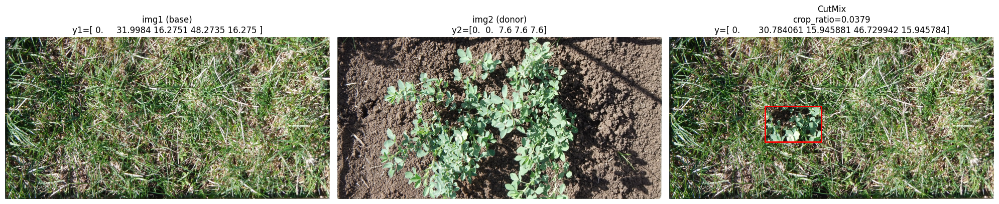

In [16]:
def cutmix_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,
    force_same_size=True,
):
    """
    Returns:
      img_mixed_arr: np.ndarray (H,W,3)
      mixed_y: np.ndarray (same shape as orig_y1)
      box: (x0, y0, w, h)
      area_ratio: float
    """
    img1 = Image.open(img_path1).convert("RGB")
    img2 = Image.open(img_path2).convert("RGB")

    if force_same_size and img1.size != img2.size:
        # 簡易対応: img2をimg1に合わせる（必要ならランダムリサイズ/クロップも可）
        img2 = img2.resize(img1.size)

    arr1 = np.array(img1)
    arr2 = np.array(img2)
    H, W = arr1.shape[:2]

    # --- sample rectangle on img1 ---
    w = random.randint(min_w, min(max_w, W))
    h = random.randint(min_h, min(max_h, H))
    x0 = random.randint(min_x0, W - w)
    y0 = random.randint(min_y0, H - h)

    # --- paste patch from img2 to img1 ---
    mixed = arr1.copy()
    mixed[y0:y0+h, x0:x0+w, :] = arr2[y0:y0+h, x0:x0+w, :]

    # --- y mixing by area ratio ---
    area = w * h
    area_ratio = area / (H * W)          # crop_ratio
    keep_ratio = 1.0 - area_ratio

    # orig_y shape: (1, n) を想定
    mixed_y = orig_y1 * keep_ratio + orig_y2 * area_ratio

    return mixed, mixed_y, (x0, y0, w, h), area_ratio

# ==========================
# example usage
# ==========================
idx1 = 0
idx2 = 1

img_id1 = img_ids[idx1]
img_id2 = img_ids[idx2]

# ここはあなたのパスの取り方に合わせてください
img_path1 = train_img_paths[idx1]
img_path2 = train_img_paths[idx2]

orig_y1 = train_pivot_df.filter(pl.col("image_id")==img_id1).select(y_cols).to_numpy().astype(np.float32)
orig_y2 = train_pivot_df.filter(pl.col("image_id")==img_id2).select(y_cols).to_numpy().astype(np.float32)

mixed_arr, mixed_y, (x0, y0, w, h), crop_ratio = cutmix_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,
    force_same_size=True
)

print("orig_y1:", orig_y1)
print("orig_y2:", orig_y2)
print("crop_ratio:", crop_ratio)
print("mixed_y:", mixed_y)

# ==========================
# visualize
# ==========================
img1_arr = np.array(Image.open(img_path1).convert("RGB"))
img2_arr = np.array(Image.open(img_path2).convert("RGB"))

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

axes[0].imshow(img1_arr)
axes[0].set_title(f"img1 (base)\ny1={orig_y1.flatten()}")
axes[0].axis("off")

axes[1].imshow(img2_arr)
axes[1].set_title(f"img2 (donor)\ny2={orig_y2.flatten()}")
axes[1].axis("off")

axes[2].imshow(mixed_arr)
axes[2].set_title(f"CutMix\ncrop_ratio={crop_ratio:.4f}\ny={mixed_y.flatten()}")
axes[2].axis("off")

# 赤枠（貼り付け領域）
rect = patches.Rectangle((x0, y0), w, h, linewidth=2, edgecolor="r", facecolor="none")
axes[2].add_patch(rect)

plt.tight_layout()
plt.show()

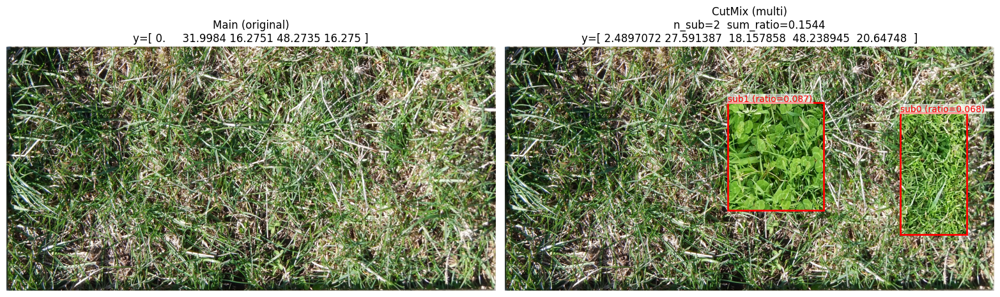

boxes: [(1618, 270, 271, 500), (912, 228, 392, 442)]
area_ratios: [0.06775, 0.086632]
sum_area_ratio: 0.15438200000000002
used_sub_indices (within img_path_subs): [1, 17]


In [17]:
def sample_non_overlapping_boxes_with_mins(
    W, H, n_boxes,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,
    max_tries=5000,
):
    """
    Returns: list of boxes [(x0, y0, w, h), ...] with no overlap.
    If constraints are too tight, it will relax x0/y0 mins to 0 for sampling safety.
    """
    boxes = []
    tries = 0

    def overlaps(a, b):
        ax, ay, aw, ah = a
        bx, by, bw, bh = b
        return not (ax + aw <= bx or bx + bw <= ax or ay + ah <= by or by + bh <= ay)

    # sanitize size bounds
    w_low = max(1, min(min_w, W))
    w_high = max(w_low, min(max_w, W))
    h_low = max(1, min(min_h, H))
    h_high = max(h_low, min(max_h, H))

    while len(boxes) < n_boxes and tries < max_tries:
        tries += 1

        w = random.randint(w_low, w_high)
        h = random.randint(h_low, h_high)

        # sanitize x0/y0 bounds
        x0_low = max(0, min(min_x0, W - w))
        x0_high = max(0, W - w)
        y0_low = max(0, min(min_y0, H - h))
        y0_high = max(0, H - h)

        # if too tight, relax mins
        if x0_low > x0_high:
            x0_low = 0
        if y0_low > y0_high:
            y0_low = 0

        x0 = random.randint(x0_low, x0_high) if x0_high >= x0_low else 0
        y0 = random.randint(y0_low, y0_high) if y0_high >= y0_low else 0

        cand = (x0, y0, w, h)
        if any(overlaps(cand, b) for b in boxes):
            continue

        boxes.append(cand)

    return boxes


def cutmix_multi_images(
    img_path_main, orig_y_main,
    img_path_subs, orig_y_subs,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,
    n_sub_min=1, n_sub_max=4,
    force_same_size=True,
):
    """
    main 1枚 + subをランダム(1~4枚)でCutMix（非重複box）
    Returns:
      mixed_arr: np.ndarray (H,W,3)
      mixed_y: np.ndarray (same shape as orig_y_main)
      boxes: list[(x0,y0,w,h)]
      area_ratios: list[float]
      used_sub_indices: list[int]  # img_path_subs の中で使ったインデックス
    """
    # --- load main ---
    img_main = Image.open(img_path_main).convert("RGB")
    arr_main = np.array(img_main)
    H, W = arr_main.shape[:2]

    # --- choose how many subs to use ---
    n_sub = random.randint(n_sub_min, n_sub_max)
    n_sub = min(n_sub, len(img_path_subs))  # safety

    # sub候補から重複なしで選ぶ
    used_sub_indices = random.sample(range(len(img_path_subs)), k=n_sub)

    # --- sample non-overlapping boxes (one per sub) ---
    boxes = sample_non_overlapping_boxes_with_mins(
        W, H, n_boxes=n_sub,
        min_w=min_w, min_h=min_h,
        max_w=max_w, max_h=max_h,
        min_x0=min_x0, min_y0=min_y0
    )

    # もし厳しすぎてboxが十分取れなかったら、その分だけsub数を減らす
    if len(boxes) < n_sub:
        used_sub_indices = used_sub_indices[:len(boxes)]
        n_sub = len(boxes)

    mixed = arr_main.copy()

    # --- y mixing ---
    total_area_ratio = 0.0
    mixed_y = np.zeros_like(orig_y_main, dtype=np.float32)

    # mainの寄与は最後にまとめて足す
    sub_contrib = np.zeros_like(orig_y_main, dtype=np.float32)

    area_ratios = []
    for box, sub_idx in zip(boxes, used_sub_indices):
        x0, y0, w, h = box

        # load sub image
        img_sub = Image.open(img_path_subs[sub_idx]).convert("RGB")
        if force_same_size and img_sub.size != img_main.size:
            img_sub = img_sub.resize(img_main.size)
        arr_sub = np.array(img_sub)

        # paste patch
        mixed[y0:y0+h, x0:x0+w, :] = arr_sub[y0:y0+h, x0:x0+w, :]

        # area ratio + y contrib
        area_ratio = (w * h) / (H * W)
        area_ratios.append(area_ratio)
        total_area_ratio += area_ratio

        sub_contrib += orig_y_subs[sub_idx] * area_ratio

    keep_ratio = max(0.0, 1.0 - total_area_ratio)
    mixed_y = orig_y_main * keep_ratio + sub_contrib

    return mixed, mixed_y, boxes, area_ratios, used_sub_indices

# =====================
# example usage + visualize
# =====================
idx_main = 0
img_id_main = img_ids[idx_main]
img_path_main = train_img_paths[idx_main]
orig_y_main = train_pivot_df.filter(pl.col("image_id")==img_id_main).select(y_cols).to_numpy().astype(np.float32)

# sub候補: main以外から適当にサンプル
sub_pool = [i for i in range(len(img_ids)) if i != idx_main]
# donor候補を多めに用意（関数内で1~4枚使う）
sub_indices = random.sample(sub_pool, k=min(20, len(sub_pool)))

img_path_subs = [train_img_paths[i] for i in sub_indices]
orig_y_subs = [
    train_pivot_df.filter(pl.col("image_id")==img_ids[i]).select(y_cols).to_numpy().astype(np.float32)
    for i in sub_indices
]

mixed_arr, mixed_y, boxes, area_ratios, used_sub_indices = cutmix_multi_images(
    img_path_main, orig_y_main,
    img_path_subs, orig_y_subs,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,
    n_sub_min=1, n_sub_max=4,
    force_same_size=True
)

# --- load original main for visualization ---
main_arr = np.array(Image.open(img_path_main).convert("RGB"))

# --- plot: original main + mixed ---
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(main_arr)
axes[0].set_title(f"Main (original)\ny={orig_y_main.flatten()}")
axes[0].axis("off")

axes[1].imshow(mixed_arr)
axes[1].set_title(
    f"CutMix (multi)\n"
    f"n_sub={len(boxes)}  sum_ratio={sum(area_ratios):.4f}\n"
    f"y={mixed_y.flatten()}"
)
axes[1].axis("off")

# draw all boxes + annotate which sub image used
for k, ((x0, y0, w, h), r, sub_idx_in_candidates) in enumerate(zip(boxes, area_ratios, used_sub_indices)):
    rect = patches.Rectangle((x0, y0), w, h, linewidth=2, edgecolor="r", facecolor="none")
    axes[1].add_patch(rect)
    axes[1].text(
        x0, y0 - 5,
        f"sub{k} (ratio={r:.3f})",
        color="r", fontsize=10,
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1)
    )

plt.tight_layout()
plt.show()

print("boxes:", boxes)
print("area_ratios:", area_ratios)
print("sum_area_ratio:", sum(area_ratios))
print("used_sub_indices (within img_path_subs):", used_sub_indices)

ratio: 0.8795432588119867
orig_y1: [[ 0.     31.9984 16.2751 48.2735 16.275 ]]
orig_y2: [[0.  0.  7.6 7.6 7.6]]
mixed_y: [[ 0.       28.143976 15.230126 43.3741   15.230037]]


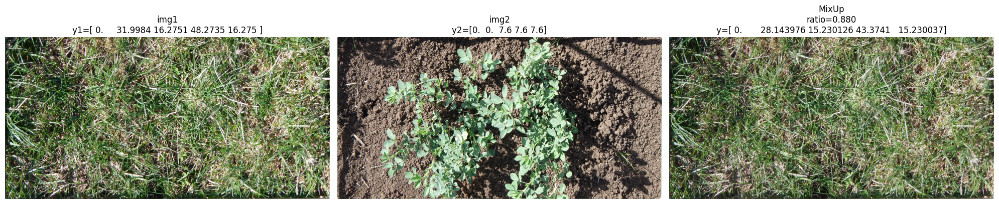

In [18]:
def mixup_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    ratio_min=0.5, ratio_max=1.0,
    force_same_size=True,
):
    """
    Returns:
      mixed_arr_uint8: np.ndarray (H,W,3) uint8
      mixed_y: np.ndarray (same shape as orig_y1)
      ratio: float
    """
    r = random.uniform(ratio_min, ratio_max)

    img1 = Image.open(img_path1).convert("RGB")
    img2 = Image.open(img_path2).convert("RGB")

    if force_same_size and img1.size != img2.size:
        img2 = img2.resize(img1.size)

    arr1 = np.array(img1).astype(np.float32)
    arr2 = np.array(img2).astype(np.float32)

    mixed = arr1 * r + arr2 * (1.0 - r)
    mixed = np.clip(mixed, 0, 255).astype(np.uint8)

    mixed_y = orig_y1 * r + orig_y2 * (1.0 - r)

    return mixed, mixed_y, r

# ==========================
# example usage + visualize
# ==========================
idx1 = 0
idx2 = 1

img_id1 = img_ids[idx1]
img_id2 = img_ids[idx2]

img_path1 = train_img_paths[idx1]
img_path2 = train_img_paths[idx2]

orig_y1 = train_pivot_df.filter(pl.col("image_id")==img_id1).select(y_cols).to_numpy().astype(np.float32)
orig_y2 = train_pivot_df.filter(pl.col("image_id")==img_id2).select(y_cols).to_numpy().astype(np.float32)

mixed_arr, mixed_y, ratio = mixup_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    ratio_min=0.5, ratio_max=1.0,
    force_same_size=True
)

print("ratio:", ratio)
print("orig_y1:", orig_y1)
print("orig_y2:", orig_y2)
print("mixed_y:", mixed_y)

# visualize
img1_arr = np.array(Image.open(img_path1).convert("RGB"))
img2_arr = np.array(Image.open(img_path2).convert("RGB"))

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

axes[0].imshow(img1_arr)
axes[0].set_title(f"img1\ny1={orig_y1.flatten()}")
axes[0].axis("off")

axes[1].imshow(img2_arr)
axes[1].set_title(f"img2\ny2={orig_y2.flatten()}")
axes[1].axis("off")

axes[2].imshow(mixed_arr)
axes[2].set_title(f"MixUp\nratio={ratio:.3f}\ny={mixed_y.flatten()}")
axes[2].axis("off")

plt.tight_layout()
plt.show()

keep_ratio: 0.959623
orig_y1: [[ 0.     31.9984 16.2751 48.2735 16.275 ]]
orig_y2: [[0.  0.  7.6 7.6 7.6]]
mixed_y: [[ 0.       30.7064   15.924826 46.631226 15.924728]]


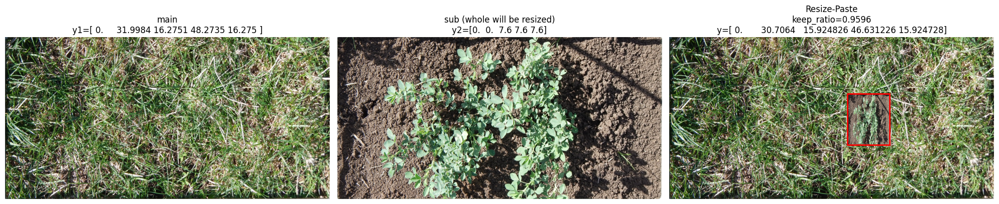

In [19]:
def resize_paste_augmentation(
    img_path_main, img_path_sub,
    orig_y_main, orig_y_sub,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=0, min_y0=0,
    force_same_size=True,
):
    """
    - mainの矩形領域(x0,y0,w,h)を決める
    - sub画像「全体」を (w,h) にリサイズして main の矩形へ貼る
    - y = y_main * keep_ratio + y_sub * (1-keep_ratio)
      keep_ratio = 1 - (w*h)/(H*W)

    Returns:
      mixed_arr: np.ndarray uint8 (H,W,3)
      mixed_y: np.ndarray (same shape as orig_y_main)
      box: (x0,y0,w,h)
      keep_ratio: float
    """
    img_main = Image.open(img_path_main).convert("RGB")
    img_sub  = Image.open(img_path_sub).convert("RGB")

    if force_same_size and img_main.size != img_sub.size:
        img_sub = img_sub.resize(img_main.size)

    arr_main = np.array(img_main)
    H, W = arr_main.shape[:2]

    # --- sample rectangle on main ---
    w_low = max(1, min(min_w, W))
    w_high = max(w_low, min(max_w, W))
    h_low = max(1, min(min_h, H))
    h_high = max(h_low, min(max_h, H))

    w = random.randint(w_low, w_high)
    h = random.randint(h_low, h_high)

    x0_low = max(0, min(min_x0, W - w))
    x0_high = max(0, W - w)
    y0_low = max(0, min(min_y0, H - h))
    y0_high = max(0, H - h)

    if x0_low > x0_high: x0_low = 0
    if y0_low > y0_high: y0_low = 0

    x0 = random.randint(x0_low, x0_high) if x0_high >= x0_low else 0
    y0 = random.randint(y0_low, y0_high) if y0_high >= y0_low else 0

    # --- resize sub (whole) to patch size, then paste ---
    sub_patch = img_sub.resize((w, h), resample=Image.BILINEAR)
    sub_patch_arr = np.array(sub_patch)

    mixed = arr_main.copy()
    mixed[y0:y0+h, x0:x0+w, :] = sub_patch_arr

    # --- y mixing ---
    area_ratio = (w * h) / (H * W)
    keep_ratio = 1.0 - area_ratio
    mixed_y = orig_y_main * keep_ratio + orig_y_sub * (1.0 - keep_ratio)  # = + orig_y_sub * area_ratio

    return mixed, mixed_y, (x0, y0, w, h), keep_ratio


# ==========================
# example usage + visualize
# ==========================
idx1 = 0
idx2 = 1

img_id1 = img_ids[idx1]
img_id2 = img_ids[idx2]

img_path1 = train_img_paths[idx1]
img_path2 = train_img_paths[idx2]

orig_y1 = train_pivot_df.filter(pl.col("image_id")==img_id1).select(y_cols).to_numpy().astype(np.float32)
orig_y2 = train_pivot_df.filter(pl.col("image_id")==img_id2).select(y_cols).to_numpy().astype(np.float32)

mixed_arr, mixed_y, (x0, y0, w, h), keep_ratio = resize_paste_augmentation(
    img_path1, img_path2,
    orig_y1, orig_y2,
    min_w=200, min_h=200,
    max_w=500, max_h=500,
    min_x0=500, min_y0=200,   # 端を避けたいなら
    force_same_size=True
)

print("keep_ratio:", keep_ratio)
print("orig_y1:", orig_y1)
print("orig_y2:", orig_y2)
print("mixed_y:", mixed_y)

# visualize
img1_arr = np.array(Image.open(img_path1).convert("RGB"))
img2_arr = np.array(Image.open(img_path2).convert("RGB"))

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

axes[0].imshow(img1_arr)
axes[0].set_title(f"main\ny1={orig_y1.flatten()}")
axes[0].axis("off")

axes[1].imshow(img2_arr)
axes[1].set_title(f"sub (whole will be resized)\ny2={orig_y2.flatten()}")
axes[1].axis("off")

axes[2].imshow(mixed_arr)
axes[2].set_title(f"Resize-Paste\nkeep_ratio={keep_ratio:.4f}\ny={mixed_y.flatten()}")
axes[2].axis("off")

rect = patches.Rectangle((x0, y0), w, h, linewidth=2, edgecolor="r", facecolor="none")
axes[2].add_patch(rect)

plt.tight_layout()
plt.show()

ratio1, ratio2: 0.5 0.5
mixed_y: [[ 0.       15.9992   11.937551 27.936749 11.9375  ]]


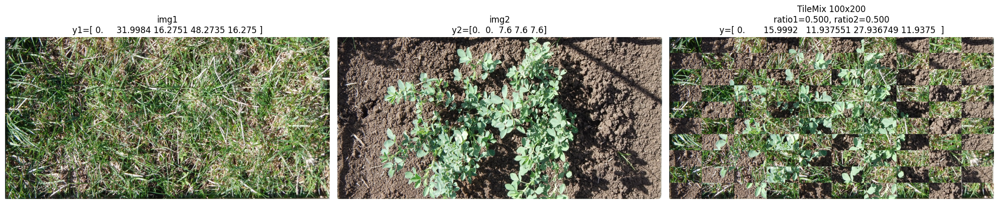

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def tile_mix_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    tile_h=100, tile_w=200,
    offset_r=0, offset_c=0,
    force_same_size=True,
):
    """
    画像を tile_h x tile_w に分割し、(r+c)の偶奇で img1/img2 を交互に配置。
    offset_r/offset_c を変えるとパターンをずらせます。

    Returns:
      mixed_arr: np.ndarray uint8 (H,W,3)
      mixed_y: np.ndarray (same shape as orig_y1)
      ratio1: img1面積比
      ratio2: img2面積比
    """
    img1 = Image.open(img_path1).convert("RGB")
    img2 = Image.open(img_path2).convert("RGB")

    if force_same_size and img1.size != img2.size:
        img2 = img2.resize(img1.size)

    arr1 = np.array(img1)
    arr2 = np.array(img2)
    H, W = arr1.shape[:2]

    mixed = arr1.copy()

    use1_area = 0
    use2_area = 0

    # タイルで走査（端が余る場合も対応）
    for y in range(0, H, tile_h):
        for x in range(0, W, tile_w):
            y2 = min(y + tile_h, H)
            x2 = min(x + tile_w, W)

            r = y // tile_h
            c = x // tile_w

            pick_img1 = ((r + offset_r) + (c + offset_c)) % 2 == 0

            area = (y2 - y) * (x2 - x)
            if pick_img1:
                mixed[y:y2, x:x2, :] = arr1[y:y2, x:x2, :]
                use1_area += area
            else:
                mixed[y:y2, x:x2, :] = arr2[y:y2, x:x2, :]
                use2_area += area

    total = H * W
    ratio1 = use1_area / total
    ratio2 = use2_area / total

    mixed_y = orig_y1 * ratio1 + orig_y2 * ratio2
    return mixed, mixed_y, ratio1, ratio2


# ==========================
# example usage + visualize
# ==========================
idx1, idx2 = 0, 1
img_id1, img_id2 = img_ids[idx1], img_ids[idx2]
img_path1, img_path2 = train_img_paths[idx1], train_img_paths[idx2]

orig_y1 = train_pivot_df.filter(pl.col("image_id")==img_id1).select(y_cols).to_numpy().astype(np.float32)
orig_y2 = train_pivot_df.filter(pl.col("image_id")==img_id2).select(y_cols).to_numpy().astype(np.float32)

mixed_arr, mixed_y, r1, r2 = tile_mix_two_images(
    img_path1, img_path2,
    orig_y1, orig_y2,
    tile_h=100, tile_w=200,
    offset_r=0, offset_c=0
)

print("ratio1, ratio2:", r1, r2)
print("mixed_y:", mixed_y)

img1_arr = np.array(Image.open(img_path1).convert("RGB"))
img2_arr = np.array(Image.open(img_path2).convert("RGB"))

fig, axes = plt.subplots(1, 3, figsize=(20, 7))
axes[0].imshow(img1_arr); axes[0].set_title(f"img1\ny1={orig_y1.flatten()}"); axes[0].axis("off")
axes[1].imshow(img2_arr); axes[1].set_title(f"img2\ny2={orig_y2.flatten()}"); axes[1].axis("off")
axes[2].imshow(mixed_arr); axes[2].set_title(f"TileMix {100}x{200}\nratio1={r1:.3f}, ratio2={r2:.3f}\ny={mixed_y.flatten()}"); axes[2].axis("off")
plt.tight_layout(); plt.show()